# Azure AutoML for Images

## AutoML for Images to train and a deploy an object detection model (Part 2)

**Important:** This feature is currently in public preview. This preview version is provided without a service-level agreement. Certain features might not be supported or might have constrained capabilities. For more information, see [Supplemental Terms of Use for Microsoft Azure Previews](https://azure.microsoft.com/en-us/support/legal/preview-supplemental-terms/).

Serge Retkowsky | serge.retkowsky@microsoft.com | V1 22-June-2022

In this notebook you will:
- You will test the model you have deployed to detect Covid19 mask

AutoML for Images links:
- What is AutoML for Images?
https://docs.microsoft.com/en-us/azure/machine-learning/concept-automated-ml#computer-vision-preview

- Algorithms
https://docs.microsoft.com/en-us/azure/machine-learning/how-to-auto-train-image-models#supported-model-algorithms

- Tutorials
https://docs.microsoft.com/en-us/azure/machine-learning/v1/tutorial-auto-train-image-models-v1

- ONNX
https://docs.microsoft.com/en-us/azure/machine-learning/how-to-inference-onnx-automl-image-models?tabs=multi-class

- How to use AutoML for Images?
https://docs.microsoft.com/en-us/azure/machine-learning/how-to-use-automl-small-object-detect
https://docs.microsoft.com/en-us/azure/machine-learning/v1/how-to-auto-train-image-models-v1


In [1]:
import requests
import matplotlib.pyplot as plt
import urllib
import time
import cv2
import os.path
import datetime
import humanize
import matplotlib.image as mpimg
import matplotlib.patches as patches
import numpy as np
import json
import azureml.core
from PIL import Image
from azureml.core import Workspace, Dataset
from azureml.core.webservice import Webservice
from IPython.display import Image
from os import path
from zipfile import ZipFile

In [2]:
ws = Workspace.from_config()
print("Azure ML workspace:", ws.name, "\nAzure ML resource group:",
      ws.resource_group)

Azure ML workspace: azuremlvision 
Azure ML resource group: azuremlvision-rg


In [3]:
print(datetime.datetime.today())

2022-06-22 08:34:41.826636


In [4]:
import sys
sys.version

'3.8.5 (default, Sep  4 2020, 07:30:14) \n[GCC 7.3.0]'

In [5]:
# Your local environment
import platform, socket, re, uuid, json, psutil, logging


def getSystemInfo():
    try:
        info = {}
        info['Platform'] = platform.system()
        info['Platform-release'] = platform.release()
        info['Platform-version'] = platform.version()
        info['Architecture'] = platform.machine()
        info['Hostname'] = socket.gethostname()
        info['IP-address'] = socket.gethostbyname(socket.gethostname())
        info['MAC-address'] = ':'.join(
            re.findall('..', '%012x' % uuid.getnode()))
        info['Processor'] = platform.processor()
        info['RAM'] = str(round(psutil.virtual_memory().total /
                                (1024.0**3))) + " Gb"
        return json.dumps(info)

    except Exception as e:
        logging.exception(e)


print("Your local environment:")
json.loads(getSystemInfo())

Your local environment:


{'Platform': 'Linux',
 'Platform-release': '5.4.0-1077-azure',
 'Platform-version': '#80~18.04.1-Ubuntu SMP Wed Apr 13 02:07:09 UTC 2022',
 'Architecture': 'x86_64',
 'Hostname': 'standardd13',
 'IP-address': '127.0.0.1',
 'MAC-address': '60:45:bd:90:9b:99',
 'Processor': 'x86_64',
 'RAM': '55 Gb'}

## 2. AutoML for Images deployed model

In [7]:
service = Webservice(workspace=ws, name='covid19-mask-detection-model')
#print(service.scoring_uri)
#print(service.swagger_uri)

In [8]:
primary, secondary = service.get_keys()

In [9]:
# URL for the web service
scoring_uri = service.scoring_uri
# If the service is authenticated, set the key or token
key = primary

Now we are able to test our model

## 3. Downloading some images to test

In [10]:
TEST_DIR = 'test'

In [11]:
if path.os.path.isdir(TEST_DIR):
    print("Directory:", TEST_DIR, "exists")

else:
    print("1. Creating directory:", TEST_DIR)
    os.mkdir(TEST_DIR)
    os.chdir(TEST_DIR)

    print("2. Downloading zip file...")
    download_url = "https://github.com/retkowsky/CustomVision_Datasets/raw/master/testimages-masks.zip"
    zip_file = "testimages-masks.zip"
    urllib.request.urlretrieve(download_url, filename=zip_file)

    print("3. Unzipping file:", zip_file)
    with ZipFile(zip_file, 'r') as zip:
        zip.extractall()

    print("4. Deleting the zip file:", zip_file)
    os.remove(zip_file)
    os.chdir('..')

    print("\nDone!")

1. Creating directory: test
2. Downloading zip file...
3. Unzipping file: testimages-masks.zip
4. Deleting the zip file: testimages-masks.zip

Done!


In [12]:
print("Tests images are available in this directory:", TEST_DIR, "\n")

for file in os.scandir(TEST_DIR):
    print(datetime.datetime.fromtimestamp(file.stat().st_atime), file.name,
          humanize.naturalsize(file.stat().st_size))

Tests images are available in this directory: test 

2022-06-22 08:35:14.127491 testimage (1).jpg 904.1 kB
2022-06-22 08:35:14.232432 testimage (2).jpg 68.7 kB
2022-06-22 08:35:14.308391 testimage (3).jpg 115.3 kB
2022-06-22 08:35:14.452309 testimage (4).jpg 116.3 kB
2022-06-22 08:35:14.534264 testimage (5).jpg 82.1 kB
2022-06-22 08:35:14.658194 testimage (6).jpg 130.2 kB
2022-06-22 08:35:14.883069 testimage (7).jpg 1.2 MB
2022-06-22 08:35:15.047976 testimage (8).jpg 563.5 kB


We have now some images to test

## 4. Functions for calling the model & viewing results

In [13]:
# Function to display an image
def view_image(sample_image):

    %matplotlib inline
    img = cv2.imread(sample_image)
    print("Image filename:", sample_image)
    plt.figure(figsize=(15, 10))
    plt.axis('off')
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [14]:
def truncate(number, nbdecimal):

    number2 = 10**nbdecimal
    int_val = int(number * number2)

    return int_val / number2

In [15]:
# Function to call the deployed model
def mask_detection_model(sample_image, minconfidence=0.7):

    t1 = time.time()

    # Init
    nb_masks = nb_nomasks = 0
    nb = 1
    nbdec = 4

    print("Azure AutoML for Images object detection model results:")

    # URL for the web service
    scoring_uri = service.scoring_uri
    # Load image data
    myimage = open(sample_image, 'rb').read()
    # Set the content type
    headers = {'Content-Type': 'application/json'}
    # If authentication is enabled, set the authorization header
    headers['Authorization'] = f'Bearer {key}'

    # Make the request and display the response
    resp = requests.post(scoring_uri, myimage, headers=headers)
    detections = json.loads(resp.text)
    
    img = cv2.imread(sample_image)
    y, x, _ = img.shape
    print("\nImage file:", sample_image, "\n")
    
    for detect in detections['boxes']:
        label = detect['label']
        box = detect['box']
        conf_score = detect['score']

        if conf_score > minconfidence:
            ymin, xmin, ymax, xmax = box['topY'], box['topX'], box[
                'bottomY'], box['bottomX']
            topleft_x, topleft_y = x * xmin, y * ymin
            width, height = x * (xmax - xmin), y * (ymax - ymin)

            print(nb, '\t', detect['label'], "with confidence =",
                  truncate(conf_score, 4), "with bounding-box:",
                  truncate(topleft_x, 3), truncate(topleft_y, 3),
                  truncate(width, 3), truncate(height, 3))

            if label == 'mask':
                nb_masks += 1

            if label == 'no-mask':
                nb_nomasks += 1

            nb += 1

    nb_faces = nb_masks + nb_nomasks

    if nb_faces > 0:
        pct_masks = nb_masks / nb_faces * 100
        pct_nomasks = nb_nomasks / nb_faces * 100

    if nb_faces == 0:
        pct_masks = pct_nomasks = 0

    # Printing results
    print("\n\033[1;31;94mTotal number of detected faces =", nb_faces)
    print("\033[1;31;32m- Number of persons wearing a mask =", nb_masks, '(',
          truncate(pct_masks, 1), '% )')
    print("\033[1;31;91m- Number of persons not wearing a mask =", nb_nomasks,
          '(', truncate(pct_nomasks, 1), '% )')

    print("\n\033[0mDone in:", round(time.time() - t1, 5), "second")

    return sample_image, detections, nb_faces, nb_masks, nb_nomasks

In [16]:
def view_detailled_results():
    
    # To display all the results from the model
    print("Model Predictions:\n")
    print("\033[1;31;94m",json.dumps(detections, indent=4))

In [17]:
def labelled_image(sample_image, minconfidence=0.7):
    
    %matplotlib inline
    fontsize1 = 12
    fontsize2 = 20
    offset1 = 10
    offset2 = 20
    
    img = cv2.imread(sample_image)
    y, x, _ = img.shape
    print("Image file:", sample_image, "\n")
    
    fig, ax = plt.subplots(1, figsize=(18, 12))
    img_np = mpimg.imread(sample_image)
    ax.imshow(img_np)
    plt.axis('off')

    # draw box and label for each detection
    for detect in detections['boxes']:
        label = detect['label']
        box = detect['box']
        conf_score = detect['score']

        if conf_score > minconfidence:
            ymin, xmin, ymax, xmax = box['topY'], box['topX'], \
            box['bottomY'], box['bottomX']
            
            topleft_x, topleft_y = x * xmin, y * ymin
            width, height = x * (xmax - xmin), y * (ymax - ymin)

            if label == 'mask':
                rect_bbox_mask = patches.Rectangle((topleft_x, topleft_y), 
                                                   width, height,
                                                   linewidth=3, edgecolor='lime', 
                                                   facecolor='none')
                ax.add_patch(rect_bbox_mask)
                
                labeltxt = label + ' (' + str(truncate(conf_score, 3)) + ')'
                plt.text(topleft_x, topleft_y - offset1, labeltxt, color='black',
                         fontsize=fontsize1, backgroundcolor='lime')

            if label == 'no-mask':
                rect_bbox_nomask = patches.Rectangle((topleft_x, topleft_y), 
                                                     width, height,
                                                     linewidth=3, edgecolor='red', 
                                                     facecolor='none')
                ax.add_patch(rect_bbox_nomask)
                
                labeltxt = label + ' (' + str(truncate(conf_score, 3)) + ')'
                plt.text(topleft_x, topleft_y - offset1, labeltxt, color='black',
                         fontsize=fontsize1, backgroundcolor='red')

    # Print Stats
    msg = "Detected Faces = " + str(nb_persons) + " with mask = " + str(nb_masks) +\
        " w/o mask = " + str(nb_nomasks) + "  (Powered by Azure AutoML for Images)"
    print(msg)
    
    # Display stats on the image
    plt.text(offset2, y * 0.75, "Detected Faces = " + str(nb_persons), color='pink', 
             fontsize=fontsize2, backgroundcolor='black')
    plt.text(offset2, y * 0.80, "with mask = " + str(nb_masks), color='lime', 
             fontsize=fontsize2, backgroundcolor='black')
    plt.text(offset2, y * 0.85, "w/o mask = " + str(nb_nomasks), color='red', 
             fontsize=fontsize2, backgroundcolor='black')
    plt.text(offset2, y * 0.95, "Powered by Azure ML", color='cyan', 
             fontsize=fontsize2, backgroundcolor='black')
    
    # Saving image
    saved_image_file = TEST_DIR + "/predicted_" + os.path.basename(sample_image)
    plt.savefig(saved_image_file)
    print("\nImage saved in:", saved_image_file)

    # Viewing image with the CV results
    plt.show()

## 5. Testing the object detection model to detect Covid19 masks

### Test 1

Image filename: test/testimage (1).jpg


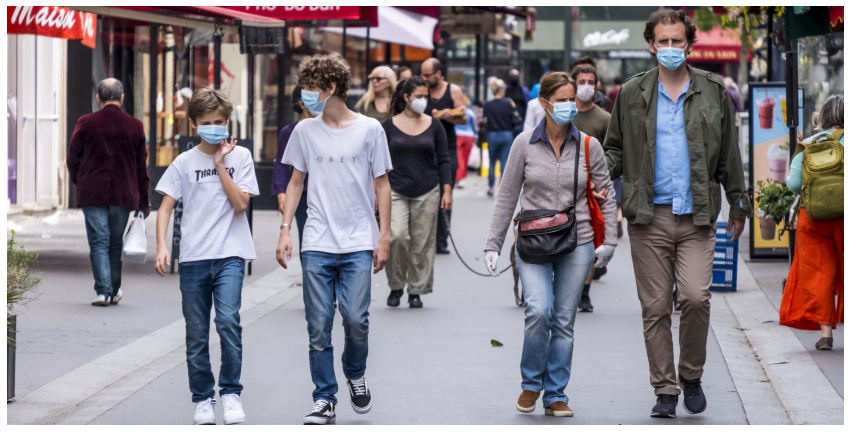

In [18]:
sample_image1 = TEST_DIR + '/testimage (1).jpg'
view_image(sample_image1)

In [19]:
sample_image1, detections, nb_persons, nb_masks, nb_nomasks = mask_detection_model(sample_image1)

Azure AutoML for Images object detection model results:

Image file: test/testimage (1).jpg 

1 	 mask with confidence = 0.9977 with bounding-box: 3483.45 433.257 273.208 373.369
2 	 mask with confidence = 0.995 with bounding-box: 4174.322 23.355 351.697 417.088
3 	 mask with confidence = 0.9949 with bounding-box: 1181.257 520.017 332.288 408.534
4 	 mask with confidence = 0.9944 with bounding-box: 2556.833 450.765 226.497 287.938
5 	 mask with confidence = 0.9929 with bounding-box: 1883.515 284.175 385.516 464.164
6 	 mask with confidence = 0.9299 with bounding-box: 3685.074 322.498 223.404 331.668
7 	 no-mask with confidence = 0.7848 with bounding-box: 2713.76 323.866 179.735 238.199
8 	 no-mask with confidence = 0.7094 with bounding-box: 2351.234 375.82 216.166 253.657

Total number of detected faces = 8
- Number of persons wearing a mask = 6 ( 75.0 % )
- Number of persons not wearing a mask = 2 ( 25.0 % )

Done in: 1.39983 second


In [20]:
view_detailled_results()

Model Predictions:

 {
    "filename": "/tmp/tmpru7wd10k/tmpk182wzd1",
    "boxes": [
        {
            "box": {
                "topX": 0.6333546447753906,
                "topY": 0.15754800160725912,
                "bottomX": 0.6830289204915364,
                "bottomY": 0.29331878662109373
            },
            "label": "mask",
            "score": 0.9977557063102722
        },
        {
            "box": {
                "topX": 0.7589677937825521,
                "topY": 0.00849294662475586,
                "bottomX": 0.8229128011067708,
                "bottomY": 0.16016136169433592
            },
            "label": "mask",
            "score": 0.995061457157135
        },
        {
            "box": {
                "topX": 0.21477401733398438,
                "topY": 0.18909737904866536,
                "bottomX": 0.27519012451171876,
                "bottomY": 0.33765543619791666
            },
            "label": "mask",
            "score": 0.99496316909790

Image file: test/testimage (1).jpg 

Detected Faces = 8 with mask = 6 w/o mask = 2  (Powered by Azure AutoML for Images)

Image saved in: test/predicted_testimage (1).jpg


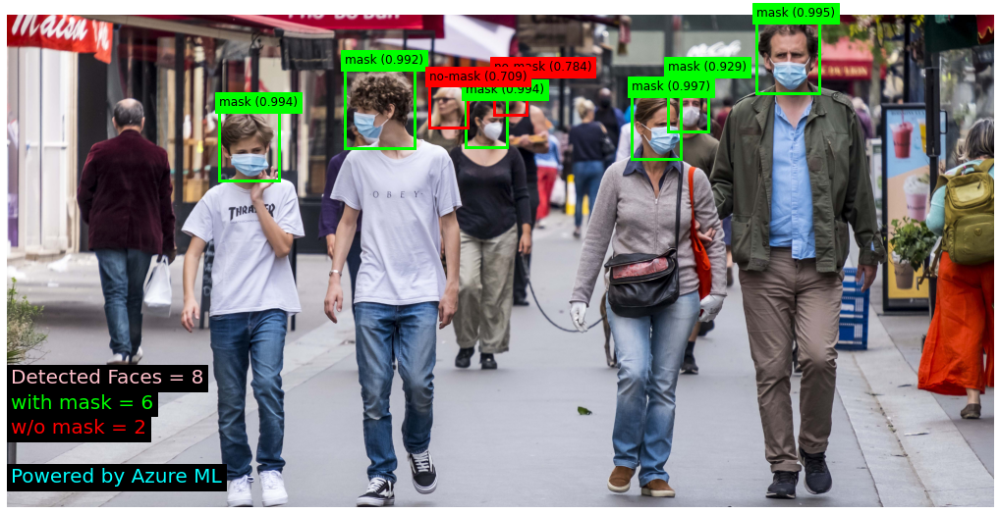

In [21]:
labelled_image(sample_image1)

### Test 2

Image filename: test/testimage (2).jpg


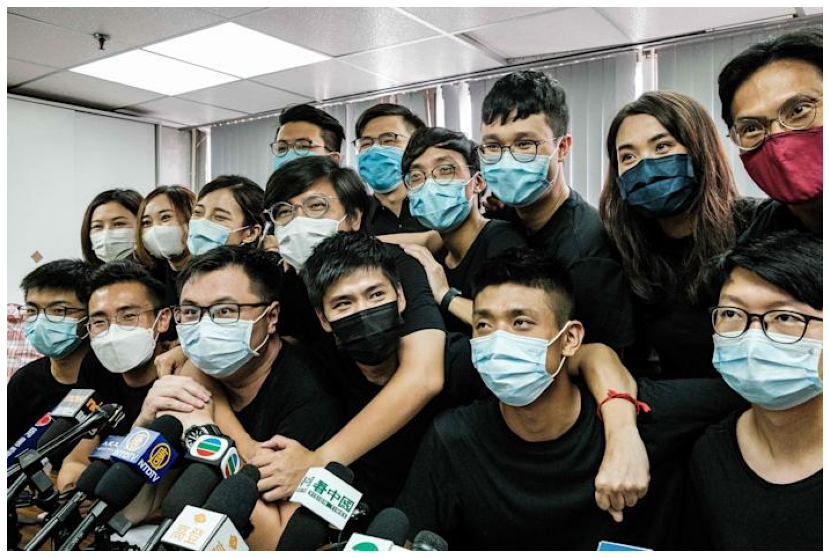

In [22]:
sample_image2 = TEST_DIR + '/testimage (2).jpg'
view_image(sample_image2)

In [23]:
sample_image2, detections, nb_persons, nb_masks, nb_nomasks = mask_detection_model(sample_image2)

Azure AutoML for Images object detection model results:

Image file: test/testimage (2).jpg 

1 	 mask with confidence = 0.9969 with bounding-box: 394.9 206.969 111.418 142.647
2 	 mask with confidence = 0.9966 with bounding-box: 143.601 207.238 99.347 117.296
3 	 mask with confidence = 0.9961 with bounding-box: 514.558 67.704 110.89 121.939
4 	 mask with confidence = 0.996 with bounding-box: 597.555 185.484 107.444 165.56
5 	 mask with confidence = 0.9958 with bounding-box: 338.724 100.12 72.502 96.074
6 	 mask with confidence = 0.995 with bounding-box: 62.705 220.545 79.37 97.342
7 	 mask with confidence = 0.9946 with bounding-box: 9.592 213.962 65.427 92.873
8 	 mask with confidence = 0.9938 with bounding-box: 401.596 49.39 92.399 126.179
9 	 mask with confidence = 0.9931 with bounding-box: 295.475 82.62 68.333 84.031
10 	 mask with confidence = 0.9929 with bounding-box: 256.082 191.942 100.382 118.731
11 	 mask with confidence = 0.9881 with bounding-box: 221.308 121.67 93.063 108.7

In [24]:
view_detailled_results()

Model Predictions:

 {
    "filename": "/tmp/tmpl8zavns9/tmpf06qhk60",
    "boxes": [
        {
            "box": {
                "topX": 0.5601429838492422,
                "topY": 0.4403601950516486,
                "bottomX": 0.7181828958174012,
                "bottomY": 0.7438649987935622
            },
            "label": "mask",
            "score": 0.9969413876533508
        },
        {
            "box": {
                "topX": 0.20368974492600286,
                "topY": 0.44093259069477775,
                "bottomX": 0.3446076491783405,
                "bottomY": 0.6904994346860653
            },
            "label": "mask",
            "score": 0.9966939687728882
        },
        {
            "box": {
                "topX": 0.7298699401244438,
                "topY": 0.14405258509869964,
                "bottomX": 0.8871612718558816,
                "bottomY": 0.403497864686587
            },
            "label": "mask",
            "score": 0.9961203336715698
  

Image file: test/testimage (2).jpg 

Detected Faces = 16 with mask = 16 w/o mask = 0  (Powered by Azure AutoML for Images)

Image saved in: test/predicted_testimage (2).jpg


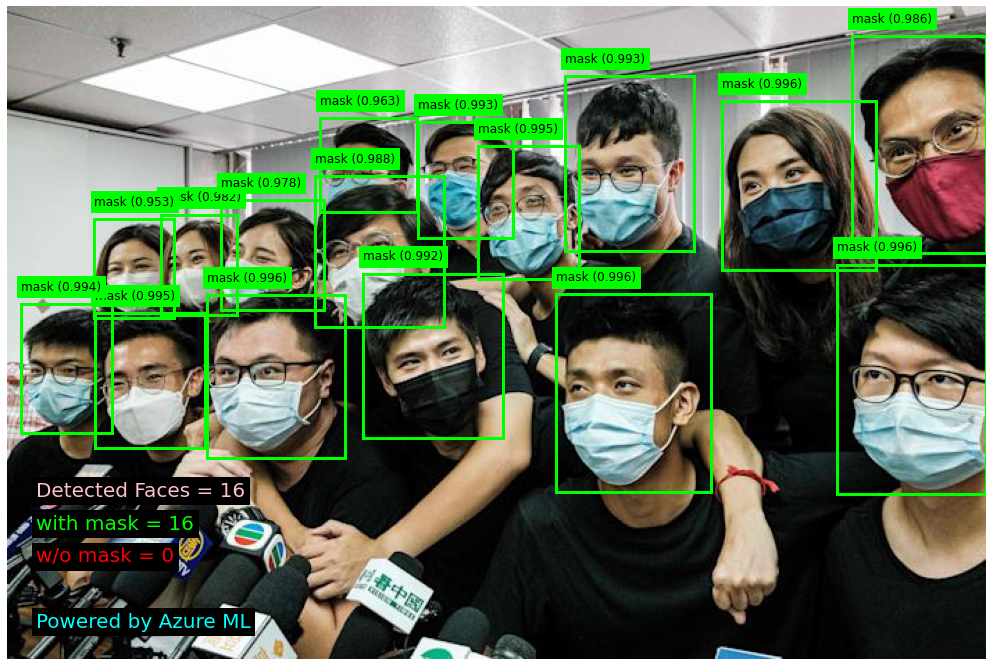

In [25]:
labelled_image(sample_image2)

### Test 3

Image filename: test/testimage (3).jpg


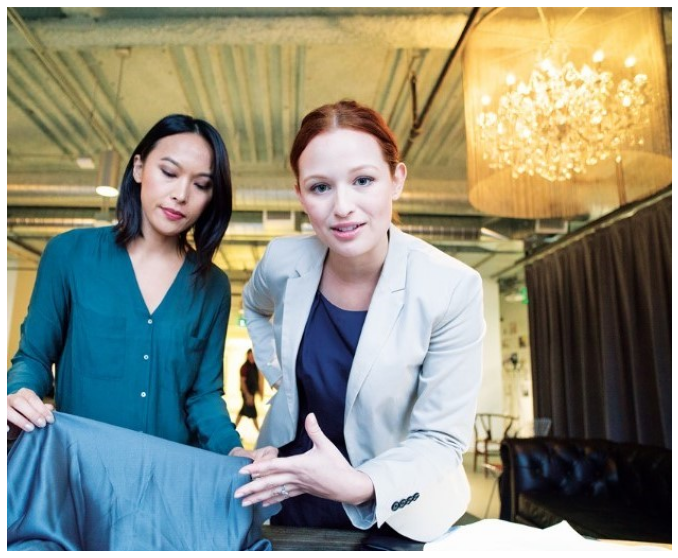

In [26]:
sample_image3 = TEST_DIR + '/testimage (3).jpg'
view_image(sample_image3)

In [27]:
sample_image3, detections, nb_persons, nb_masks, nb_nomasks = mask_detection_model(sample_image3)

Azure AutoML for Images object detection model results:

Image file: test/testimage (3).jpg 

1 	 no-mask with confidence = 0.923 with bounding-box: 101.576 98.668 114.011 127.465
2 	 no-mask with confidence = 0.8549 with bounding-box: 255.356 80.458 123.975 156.534

Total number of detected faces = 2
- Number of persons wearing a mask = 0 ( 0.0 % )
- Number of persons not wearing a mask = 2 ( 100.0 % )

Done in: 0.49677 second


In [28]:
view_detailled_results()

Model Predictions:

 {
    "filename": "/tmp/tmpvnvq1dqq/tmp7vrzxmlu",
    "boxes": [
        {
            "box": {
                "topX": 0.16200452026533724,
                "topY": 0.19233568827311198,
                "bottomX": 0.3438411988470434,
                "bottomY": 0.4408067830403646
            },
            "label": "no-mask",
            "score": 0.9230042695999146
        },
        {
            "box": {
                "topX": 0.4072674885290544,
                "topY": 0.15683883666992188,
                "bottomX": 0.604995498553142,
                "bottomY": 0.46197367350260415
            },
            "label": "no-mask",
            "score": 0.8549118638038635
        },
        {
            "box": {
                "topX": 0.4066631738680935,
                "topY": 0.17271405537923176,
                "bottomX": 0.6142944502472715,
                "bottomY": 0.45901987711588543
            },
            "label": "mask",
            "score": 0.3319251537

Image file: test/testimage (3).jpg 

Detected Faces = 2 with mask = 0 w/o mask = 2  (Powered by Azure AutoML for Images)

Image saved in: test/predicted_testimage (3).jpg


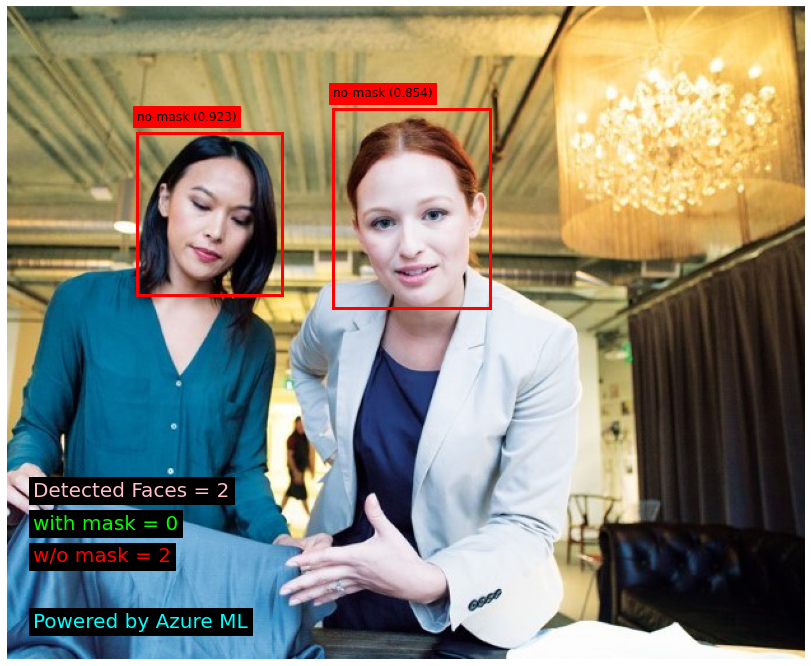

In [29]:
labelled_image(sample_image3)

### Test 4

Image filename: test/testimage (4).jpg


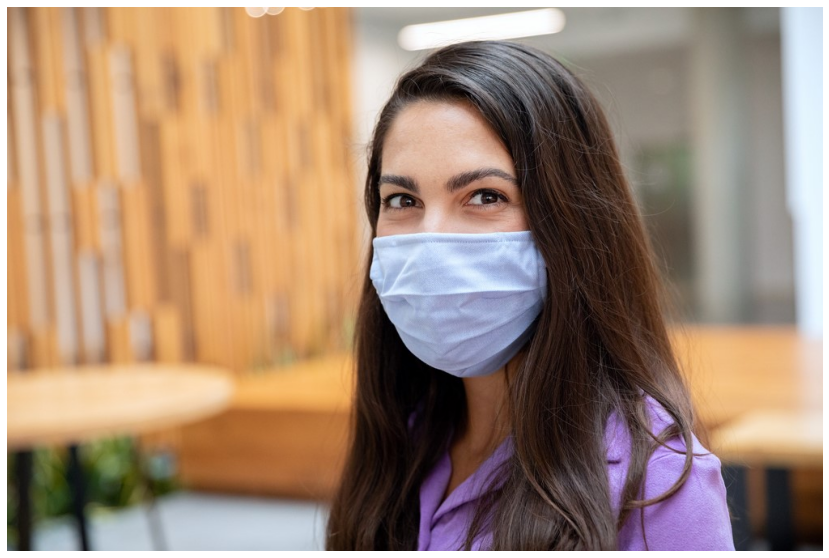

In [30]:
sample_image4 = TEST_DIR + '/testimage (4).jpg'
view_image(sample_image4)

In [31]:
sample_image4, detections, nb_persons, nb_masks, nb_nomasks = mask_detection_model(sample_image4)

Azure AutoML for Images object detection model results:

Image file: test/testimage (4).jpg 

1 	 mask with confidence = 0.998 with bounding-box: 415.561 36.514 338.215 436.768

Total number of detected faces = 1
- Number of persons wearing a mask = 1 ( 100.0 % )
- Number of persons not wearing a mask = 0 ( 0.0 % )

Done in: 0.5375 second


In [32]:
view_detailled_results()

Model Predictions:

 {
    "filename": "/tmp/tmpzuoz97ea/tmp1ax2loyb",
    "boxes": [
        {
            "box": {
                "topX": 0.4122629812747671,
                "topY": 0.0543370573269903,
                "bottomX": 0.747794044163654,
                "bottomY": 0.7042900684082847
            },
            "label": "mask",
            "score": 0.9980880618095398
        }
    ]
}


Image file: test/testimage (4).jpg 

Detected Faces = 1 with mask = 1 w/o mask = 0  (Powered by Azure AutoML for Images)

Image saved in: test/predicted_testimage (4).jpg


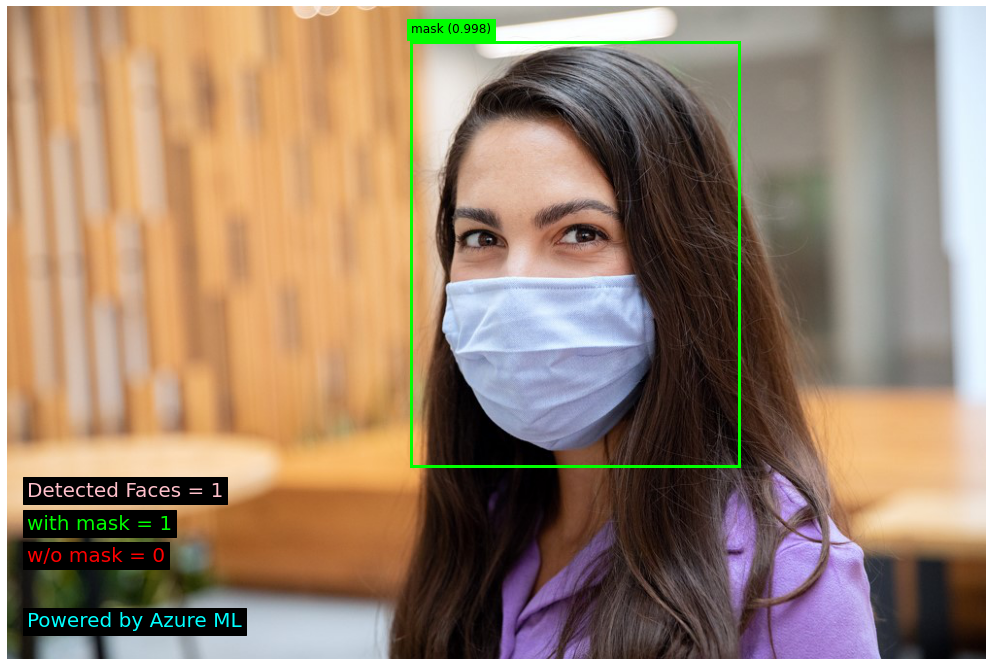

In [33]:
labelled_image(sample_image4)

### Test 5

Image filename: test/testimage (5).jpg


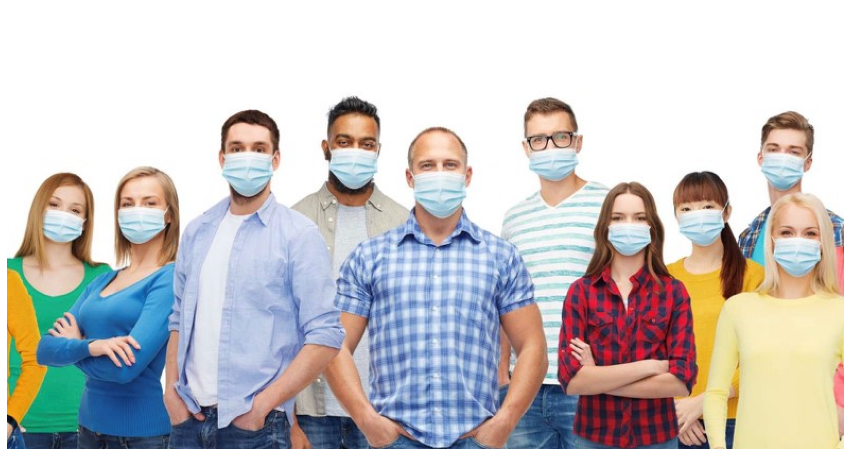

In [34]:
sample_image5 = TEST_DIR + '/testimage (5).jpg'
view_image(sample_image5)

In [35]:
sample_image5, detections, nb_persons, nb_masks, nb_nomasks = mask_detection_model(sample_image5)

Azure AutoML for Images object detection model results:

Image file: test/testimage (5).jpg 

1 	 mask with confidence = 0.9984 with bounding-box: 194.235 95.448 68.774 86.427
2 	 mask with confidence = 0.998 with bounding-box: 98.744 147.704 66.632 82.649
3 	 mask with confidence = 0.9976 with bounding-box: 624.757 152.226 60.751 77.777
4 	 mask with confidence = 0.9973 with bounding-box: 373.588 111.815 69.656 92.29
5 	 mask with confidence = 0.9973 with bounding-box: 292.472 82.667 64.574 93.396
6 	 mask with confidence = 0.9965 with bounding-box: 554.21 162.358 64.429 76.28
7 	 mask with confidence = 0.9965 with bounding-box: 715.287 175.582 62.488 83.004
8 	 mask with confidence = 0.9964 with bounding-box: 481.141 84.914 66.485 83.453
9 	 mask with confidence = 0.9963 with bounding-box: 16.343 154.315 68.175 73.482
10 	 mask with confidence = 0.9952 with bounding-box: 703.998 95.052 59.797 82.495

Total number of detected faces = 10
- Number of persons wearing a mask = 10 ( 100.0 

In [36]:
view_detailled_results()

Model Predictions:

 {
    "filename": "/tmp/tmp0qu6ed99/tmptfawsm76",
    "boxes": [
        {
            "box": {
                "topX": 0.24617938743288822,
                "topY": 0.22889363606770832,
                "bottomX": 0.3333463021837142,
                "bottomY": 0.4361536153157552
            },
            "label": "mask",
            "score": 0.9984353184700012
        },
        {
            "box": {
                "topX": 0.12515186192180616,
                "topY": 0.3542062377929687,
                "bottomX": 0.20960400283074063,
                "bottomY": 0.5524075317382813
            },
            "label": "mask",
            "score": 0.9980792999267578
        },
        {
            "box": {
                "topX": 0.7918344640521751,
                "topY": 0.3650518290201823,
                "bottomX": 0.8688331906490914,
                "bottomY": 0.5515695699055989
            },
            "label": "mask",
            "score": 0.9976235032081604


Image file: test/testimage (5).jpg 

Detected Faces = 10 with mask = 10 w/o mask = 0  (Powered by Azure AutoML for Images)

Image saved in: test/predicted_testimage (5).jpg


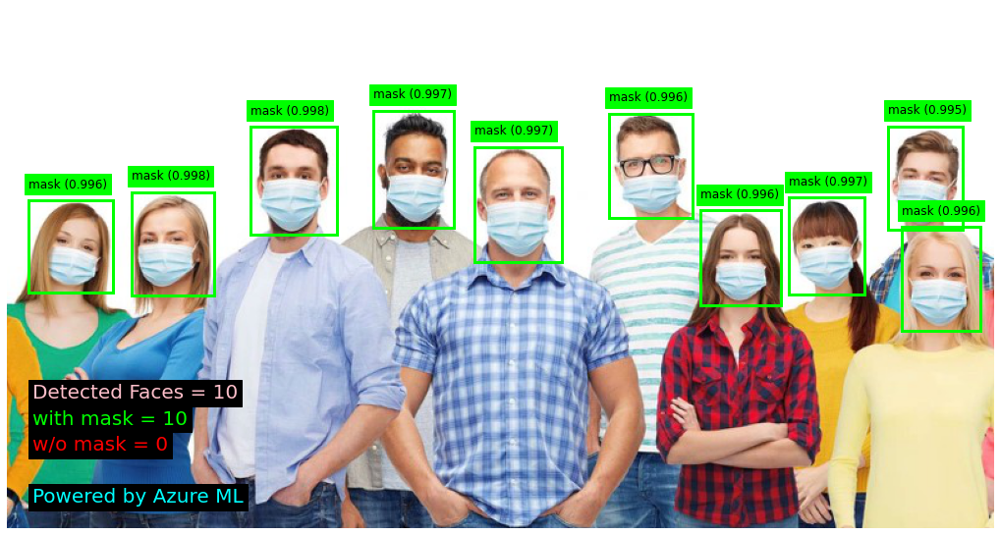

In [37]:
labelled_image(sample_image5)

### Test 6

Image filename: test/testimage (6).jpg


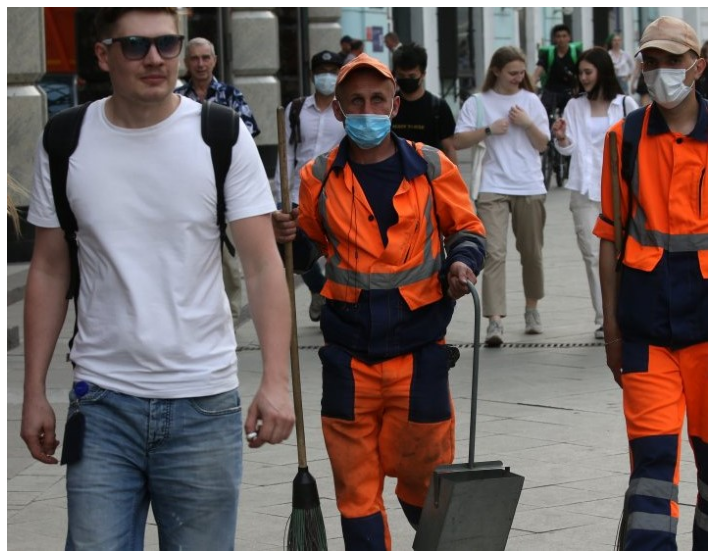

In [38]:
sample_image6 = TEST_DIR + '/testimage (6).jpg'
view_image(sample_image6)

In [39]:
sample_image6, detections, nb_persons, nb_masks, nb_nomasks = mask_detection_model(sample_image6)

Azure AutoML for Images object detection model results:

Image file: test/testimage (6).jpg 

1 	 mask with confidence = 0.9971 with bounding-box: 640.653 8.577 71.418 100.96
2 	 mask with confidence = 0.9959 with bounding-box: 306.618 40.924 38.476 53.34
3 	 mask with confidence = 0.9943 with bounding-box: 331.169 48.771 71.77 98.127
4 	 no-mask with confidence = 0.9321 with bounding-box: 80.587 0.0 115.804 99.739
5 	 no-mask with confidence = 0.9294 with bounding-box: 180.603 27.84 36.005 51.07
6 	 no-mask with confidence = 0.9066 with bounding-box: 487.188 37.659 45.977 53.351
7 	 no-mask with confidence = 0.8784 with bounding-box: 579.124 39.976 40.638 52.239
8 	 mask with confidence = 0.8223 with bounding-box: 384.234 22.552 18.74 24.423
9 	 no-mask with confidence = 0.8071 with bounding-box: 553.371 16.336 25.798 32.248
10 	 mask with confidence = 0.7691 with bounding-box: 390.156 35.84 43.847 56.24

Total number of detected faces = 10
- Number of persons wearing a mask = 5 ( 50.

In [40]:
view_detailled_results()

Model Predictions:

 {
    "filename": "/tmp/tmpqsqixwj_/tmpnlmk7r90",
    "boxes": [
        {
            "box": {
                "topX": 0.8960182308533031,
                "topY": 0.015454158782958985,
                "bottomX": 0.9959043196445919,
                "bottomY": 0.19736569722493488
            },
            "label": "mask",
            "score": 0.9971197843551636
        },
        {
            "box": {
                "topX": 0.4288373166415358,
                "topY": 0.07373728434244792,
                "bottomX": 0.4826501638778133,
                "bottomY": 0.16984705607096354
            },
            "label": "mask",
            "score": 0.9959087371826172
        },
        {
            "box": {
                "topX": 0.46317477053311207,
                "topY": 0.08787720362345378,
                "bottomX": 0.5635526192620628,
                "bottomY": 0.2646831258138021
            },
            "label": "mask",
            "score": 0.99439185857772

Image file: test/testimage (6).jpg 

Detected Faces = 10 with mask = 5 w/o mask = 5  (Powered by Azure AutoML for Images)

Image saved in: test/predicted_testimage (6).jpg


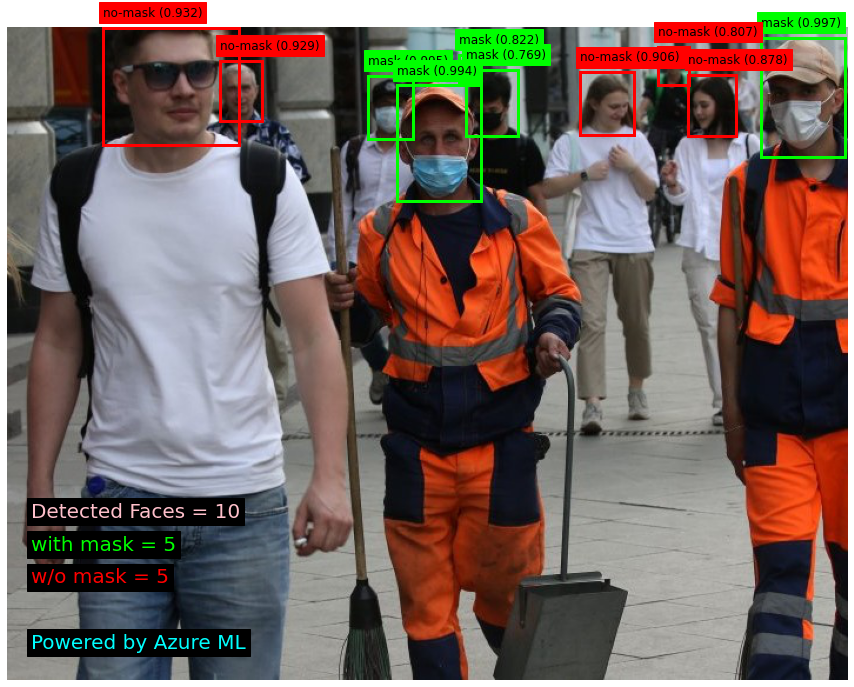

In [41]:
labelled_image(sample_image6)

### Test 7

Image filename: test/testimage (7).jpg


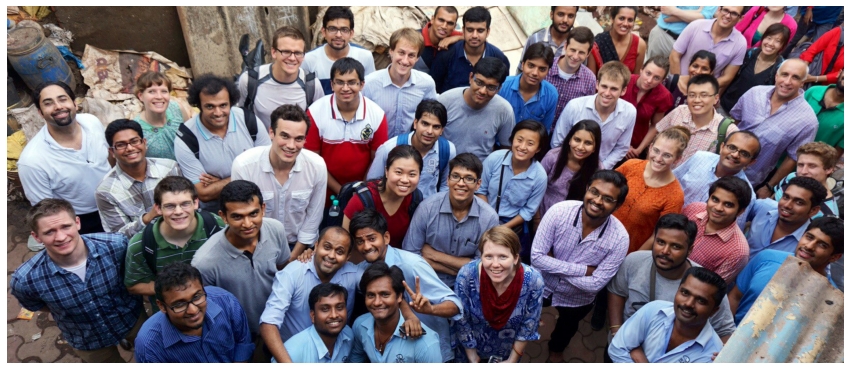

In [42]:
sample_image7 = TEST_DIR + '/testimage (7).jpg'
view_image(sample_image7)

In [43]:
sample_image7, detections, nb_persons, nb_masks, nb_nomasks = mask_detection_model(sample_image7)

Azure AutoML for Images object detection model results:

Image file: test/testimage (7).jpg 

1 	 no-mask with confidence = 0.9647 with bounding-box: 875.704 0.103 61.696 86.841
2 	 no-mask with confidence = 0.9611 with bounding-box: 902.142 423.562 96.03 106.812
3 	 no-mask with confidence = 0.9609 with bounding-box: 355.18 126.712 90.582 119.219
4 	 no-mask with confidence = 0.957 with bounding-box: 401.988 335.853 101.426 116.725
5 	 no-mask with confidence = 0.9563 with bounding-box: 245.552 122.95 76.315 90.616
6 	 no-mask with confidence = 0.9555 with bounding-box: 499.404 186.011 89.515 113.543
7 	 no-mask with confidence = 0.9528 with bounding-box: 732.222 40.4 74.517 93.059
8 	 no-mask with confidence = 0.9526 with bounding-box: 674.764 495.166 94.898 117.167
9 	 no-mask with confidence = 0.9507 with bounding-box: 272.643 324.012 103.805 110.019
10 	 no-mask with confidence = 0.9504 with bounding-box: 601.908 0.578 73.865 84.184
11 	 no-mask with confidence = 0.9481 with bound

In [44]:
view_detailled_results()

Model Predictions:

 {
    "filename": "/tmp/tmp_6qyua0_/tmp3sopt7ph",
    "boxes": [
        {
            "box": {
                "topX": 0.5418965367562594,
                "topY": 0.0001509462925071649,
                "bottomX": 0.5800749656408243,
                "bottomY": 0.12637365432012648
            },
            "label": "no-mask",
            "score": 0.9647300839424133
        },
        {
            "box": {
                "topX": 0.5582566601122937,
                "topY": 0.6156432136656746,
                "bottomX": 0.6176817336658383,
                "bottomY": 0.7708944761353616
            },
            "label": "no-mask",
            "score": 0.9611265659332275
        },
        {
            "box": {
                "topX": 0.21979018466774897,
                "topY": 0.18417484882226906,
                "bottomX": 0.2758439930417175,
                "bottomY": 0.3574582861844825
            },
            "label": "no-mask",
            "score": 0.960984

Image file: test/testimage (7).jpg 

Detected Faces = 46 with mask = 0 w/o mask = 46  (Powered by Azure AutoML for Images)

Image saved in: test/predicted_testimage (7).jpg


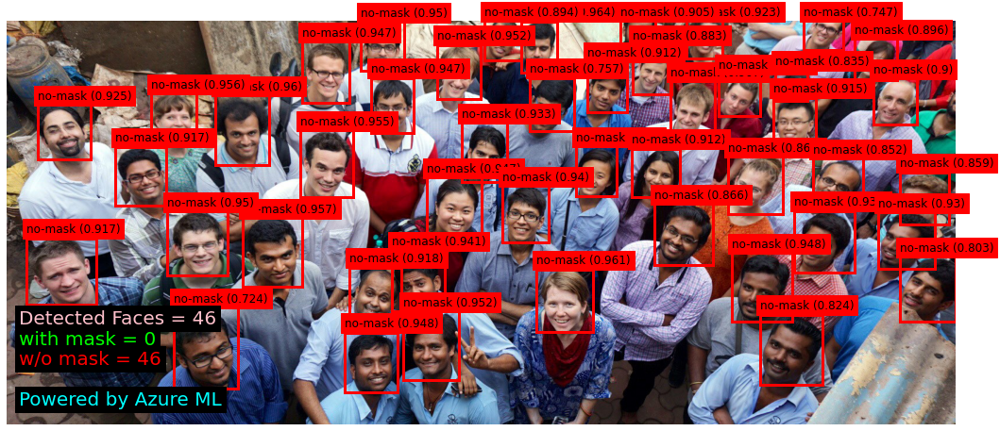

In [45]:
labelled_image(sample_image7)

### Test 8

Image filename: test/testimage (8).jpg


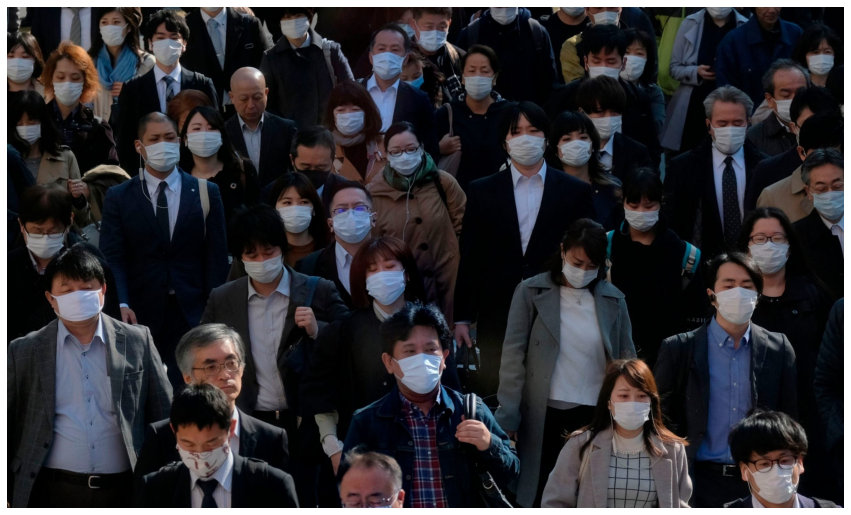

In [46]:
sample_image8 = TEST_DIR + '/testimage (8).jpg'
view_image(sample_image8)

In [47]:
sample_image8, detections, nb_persons, nb_masks, nb_nomasks = mask_detection_model(sample_image8, 0.5)

Azure AutoML for Images object detection model results:

Image file: test/testimage (8).jpg 

1 	 mask with confidence = 0.9984 with bounding-box: 101.247 701.998 217.894 258.688
2 	 mask with confidence = 0.997 with bounding-box: 1096.574 869.415 245.611 298.609
3 	 mask with confidence = 0.996 with bounding-box: 1820.195 463.315 145.592 214.68
4 	 mask with confidence = 0.9958 with bounding-box: 1111.123 340.824 149.228 164.701
5 	 mask with confidence = 0.9956 with bounding-box: 2069.519 717.978 184.016 240.488
6 	 mask with confidence = 0.9952 with bounding-box: 1603.65 295.727 151.308 187.188
7 	 mask with confidence = 0.9949 with bounding-box: 1759.777 1027.489 186.798 243.515
8 	 mask with confidence = 0.9948 with bounding-box: 1025.618 667.348 198.442 229.528
9 	 mask with confidence = 0.9938 with bounding-box: 0.0 77.56 109.226 160.494
10 	 mask with confidence = 0.993 with bounding-box: 1624.403 619.286 166.844 223.726
11 	 mask with confidence = 0.9928 with bounding-box: 804

In [48]:
view_detailled_results()

Model Predictions:

 {
    "filename": "/tmp/tmp2lj9ismf/tmp74jt15ca",
    "boxes": [
        {
            "box": {
                "topX": 0.04067781870950482,
                "topY": 0.47145612968228295,
                "bottomX": 0.12822068570378772,
                "bottomY": 0.6451890846723706
            },
            "label": "mask",
            "score": 0.9984011054039001
        },
        {
            "box": {
                "topX": 0.4405684176081431,
                "topY": 0.5838920580524833,
                "bottomX": 0.5392470673886601,
                "bottomY": 0.7844355460598393
            },
            "label": "mask",
            "score": 0.9970136880874634
        },
        {
            "box": {
                "topX": 0.7312959530158433,
                "topY": 0.3111585002510695,
                "bottomX": 0.7897902924619511,
                "bottomY": 0.45533591956646496
            },
            "label": "mask",
            "score": 0.9960553646087646


Image file: test/testimage (8).jpg 

Detected Faces = 42 with mask = 37 w/o mask = 5  (Powered by Azure AutoML for Images)

Image saved in: test/predicted_testimage (8).jpg


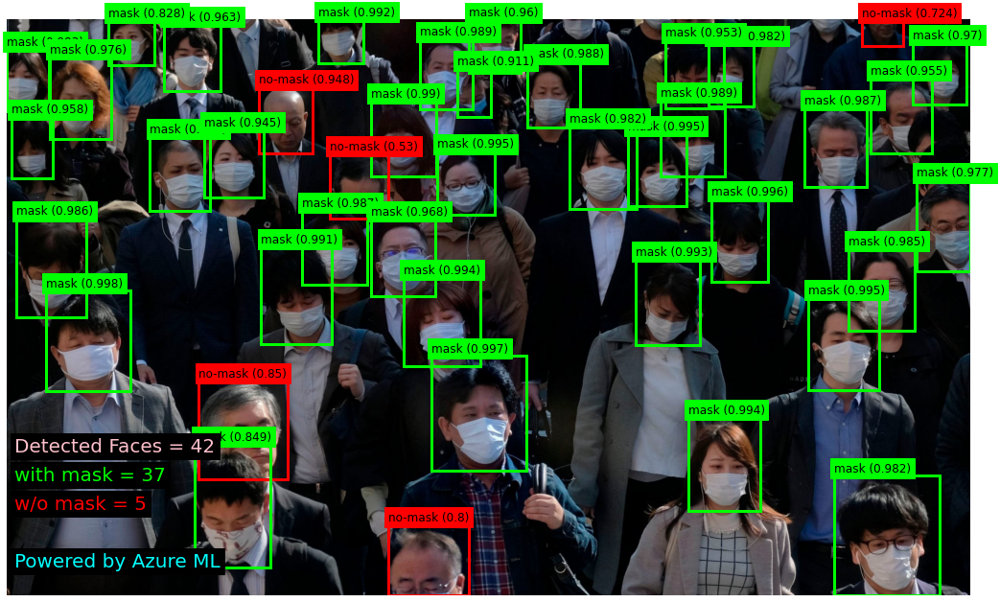

In [49]:
labelled_image(sample_image8, 0.5)

Done. So we have built and deployed an object detection model using AutoML for Images.

## 6. Misc

In [50]:
import imageio
print("Generating an animated GIF file of the processed images...")

animated_gif_file = 'animatedgif.gif'
imagesgif = []

imageslist = [file for file in os.listdir(TEST_DIR) if file.startswith(('predicted'))]
for image in imageslist:
    imagesgif.append(imageio.imread(TEST_DIR + '/' + image))
    imageio.mimsave(animated_gif_file, imagesgif, duration = 2, fps = 30)

print("Done")

Generating an animated GIF file of the processed images...
Done


In [51]:
!ls *.gif -lh

-rwxrwxrwx 1 root root 4.0M Jun 22 08:36 animatedgif.gif


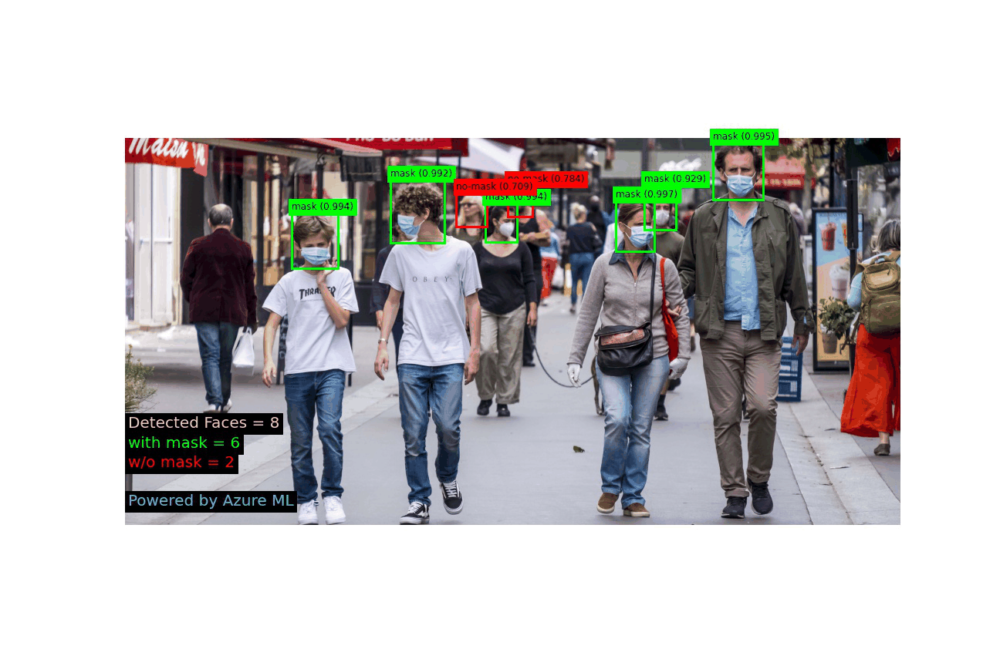

In [52]:
from IPython.display import Image
Image(filename=animated_gif_file)

## 7. Post processing
You can delete the deployed model endpoint from Azure ML Studio